<a href="https://colab.research.google.com/github/MehdiJmlkh/DLS25-HW5/blob/master/Direct_Ascent_Synthesis_generation_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
os._exit(0)


# Basic demo for Direct Ascent Synthesis (DAS)
This is a basic demo that showcases the key capabilities of the Direct Ascent Synthesis (DAS) method by Stanislav Fort and Jonathan Withaker described in the paper [Direct Ascent Synthesis: Revealing Hidden Generative Capabilities in Discriminative Models
](https://arxiv.org/abs/2502.07753) (https://arxiv.org/abs/2502.07753)

# Basic setup

In [1]:
! pip install open_clip_torch
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 25.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
  

In [2]:
import clip
import torch
from PIL import Image
import open_clip
import tqdm
import matplotlib.pyplot as plt
from torch.optim import AdamW, Adam, SGD
import numpy as np
import torch.nn.functional as F
from torch.optim.lr_scheduler import CosineAnnealingLR, LambdaLR
from scipy import stats
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

device = "cuda" if torch.cuda.is_available() else "cpu"

# Getting the CLIP models

In [3]:
class CLIPModel:
    def __init__(self, model, tokenizer, preprocess, device='cuda'):
        self.model = model
        self.tokenizer = tokenizer
        self.mean = torch.Tensor(preprocess.transforms[-1].mean) \
                         .reshape([1, 3, 1, 1]) \
                         .to(device)
        self.std = torch.Tensor(preprocess.transforms[-1].std) \
                        .reshape([1, 3, 1, 1]) \
                        .to(device)

    def encode_text(self, texts):
        tokenized_text = self.tokenizer(texts).to(device)
        text_embeddings = self.model.encode_text(tokenized_text)
        return text_embeddings

    def encode_image(self, images):
        normalized_images = self.normalize_image(images)
        image_embeddings = self.model.encode_image(normalized_images)
        return image_embeddings

    def normalize_image(self, x):
        return (x - self.mean) / self.std

    def eval(self):
        self.model.eval()

In [4]:
models_to_load = [
    ("ViT-B-32", "laion400m_e32"),
    ("ViT-B-32", "laion2b_s34b_b79k"),
    ("OpenAI-ViT-B/32", None),
]

models = []
for model_name, pretrained in models_to_load:
    if pretrained is not None:  # openclip models
        model, _, preprocess = open_clip.create_model_and_transforms(
            model_name=model_name,
            pretrained=pretrained
        )

        tokenizer = open_clip.get_tokenizer(model_name)

    else:  # clip models
        model, preprocess = clip.load(model_name.split("OpenAI-")[1])

        tokenizer = clip.tokenize

    print(f"Loaded {model_name} {preprocess}")
    model.to(device)
    models.append(CLIPModel(model, tokenizer, preprocess))

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/open_clip/factory.py:388: UserWarning: These pretrained weights were trained with QuickGELU activation but the model config does not have that enabled. Consider using a model config with a "-quickgelu" suffix or enable with a flag.
  warnings.warn(


Loaded ViT-B-32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7eb083d2c0e0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loaded ViT-B-32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7eb083d2c0e0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


100%|███████████████████████████████████████| 338M/338M [00:18<00:00, 19.0MiB/s]


Loaded OpenAI-ViT-B/32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7eb0b3146f20>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


# Tooling for dealing with CLIPs

In [5]:
def similarity_score(
    image_embeddings,
    text_embeddings,
    text_weights=None,
):
    text_embeddings_normed = text_embeddings / \
        text_embeddings.norm(dim=-1, keepdim=True).float()

    image_embeddings_normed = image_embeddings / \
        image_embeddings.norm(dim=-1, keepdim=True).float()

    scores = image_embeddings_normed @ text_embeddings_normed.T

    if text_weights is None:
        return torch.mean(scores, axis=1)  # [images, texts]
    else:
        # [images, texts]
        return torch.mean(scores * torch.Tensor(text_weights).to(device).reshape([1, -1]), axis=1)

In [6]:
def raw_to_real_image(raw_image):
    return 0.5 * torch.tanh(raw_image) + 0.5


def real_to_raw_image(real_image, eps=1e-5):
    tanh_result = torch.clip(real_image, eps, 1-eps) * 2.0 - 1.0
    return torch.arctanh(tanh_result)

# Augmentation tools

In [7]:
import torch


def add_jitter(x, size=3):
    x_shift = np.random.choice(range(-size, size+1))
    y_shift = np.random.choice(range(-size, size+1))

    x = torch.roll(x, shifts=(x_shift, y_shift), dims=(-2, -1))
    return x


def center_crop(x, out_size=224):
    in_size = x.shape[2]
    begin = (in_size - out_size) // 2
    end = begin + out_size

    x = x[:, :, begin:end, begin:end]
    return x


def add_noise(x, scale=0.1):
    return x + scale * torch.rand_like(x)


def augment_image(
    image_in: torch.Tensor,
    count: int = 1,
    clip: bool = True,
    jitter_scale: float = 3,
    noise_scale: float = 0.1
) -> torch.Tensor:

    augmented_images = []
    for _ in range(count):
        augmented_img = add_jitter(image_in, size=jitter_scale)
        augmented_img = center_crop(augmented_img)
        augmented_img = add_noise(augmented_img, scale=noise_scale)

        augmented_images.append(augmented_img)

    result = torch.cat(augmented_images, dim=0)
    return torch.clamp(result, 0, 1) if clip else result

# Image generation using DAS

In [61]:


def generate_image(
    models,
    text_weight_pairs,
    source_image=None,
    original_resolution=224,
    large_resolution=224 + 2 * 56,  # adding the buffer on the side
    resolutions=range(1, 336 + 1),
    batch_size=32,
    lr=2e-1,
    steps=100,
    jitter_scale=56,
    noise_scale=0.2,
    augmentation_copies=32,  # how many augmentations to get a gradient from at once
    step_to_show=10,  # how often to show the image during generation
    num_generations=1,
    guiding_images=None,
    image_weights=None,
    inpainting_mask=None,
):
    target_texts = [x[1] for x in text_weight_pairs]
    target_weights = [x[0] for x in text_weight_pairs]

    # just making sure no duplicates and sorted
    resolutions = sorted(set(resolutions))
    print(f"Resolutions = {resolutions}")

    guiding_embeddings, guiding_weights = get_guidance(
        models, guiding_images, image_weights, target_texts, target_weights)

    starting_image = get_starting_image(
        source_image, large_resolution, num_generations)

    batch_count = int(np.ceil(augmentation_copies / batch_size))

    raw_starting_image = real_to_raw_image(starting_image)

    components = [torch.zeros(
        num_generations, 3, res, res, requires_grad=True, device=device) for res in resolutions]

    optimizer = SGD(components, lr=lr)

    # Scheduler setup -- just constant works well!
    scheduler = LambdaLR(optimizer, lambda step: 1.0)

    collected_images = []
    for step in tqdm.tqdm(range(steps)):
        components_sum = sum([F.interpolate(p, size=(
            large_resolution, large_resolution), mode='bicubic') for p in components])

        if inpainting_mask is not None:
            components_sum.register_hook(
                lambda grad: grad * inpainting_mask if inpainting_mask is not None else grad)

        losses = []
        for it in range(batch_count):
            image_count = min(
                [batch_size, augmentation_copies - (it * batch_size)])

            for model, model_guiding_embeddings in zip(models, guiding_embeddings):
                model.eval()

                input_image = raw_to_real_image(raw_starting_image + components_sum)

                image_variations = augment_image(
                    input_image,
                    image_count,
                    jitter_scale=jitter_scale,
                    noise_scale=noise_scale,
                )

                image_embeddings = model.encode_image(image_variations)
                loss = -1.0 * similarity_score(
                    image_embeddings=image_embeddings,
                    text_embeddings=model_guiding_embeddings,
                    text_weights=guiding_weights,
                )

                loss = torch.mean(loss) * num_generations
                losses.append(loss.item())
                loss.backward(retain_graph=True)

        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

        collected_images.append(
            raw_to_real_image(raw_starting_image + components_sum).detach().cpu()
        )

        ell_infty = torch.max(
            torch.abs(collected_images[-1][0]-collected_images[0][0])) * 255

        if step % step_to_show == 0:
            print(f"step={step} {[round(x) for x in losses]} ell_infty={ell_infty:.0f}/255")
            plot_collected_images(num_generations, collected_images)

    return collected_images, components


def get_starting_image(source_image, large_resolution, num_generations):
    if source_image is None:
        original_image = torch.full(
            (num_generations, 3, large_resolution, large_resolution), 0.5).to(device)
    else:
        original_image = torch.concatenate(
            [source_image] * num_generations, axis=0).to(device)

    return original_image


def plot_collected_images(num_generations, collected_images):
    plt.figure(figsize=(3 * 5.5, num_generations * 5), dpi=75)
    for i in range(num_generations):
        plt.subplot(num_generations, 3, 1 + i * 3)
        img_show(collected_images[0][i])
        plt.title("Source image")

        plt.subplot(num_generations, 3, 2 + i * 3)
        img_show(collected_images[-1][i])
        plt.title("Generated image")

        plt.subplot(num_generations, 3, 3 + i * 3)
        img_show(
            0.5 + (collected_images[-1][i] - collected_images[0][i]))
        plt.title("Residual image")

    plt.show()


def get_guidance(models, guiding_images, image_weights, target_texts, target_weights):
    text_embeddings = torch.stack(
        [model.encode_text(target_texts).detach() for model in models])  # (#models, batch, features)

    if guiding_images is None:
        return text_embeddings, target_weights
    else:
        guiding_image_embeddings = torch.stack(
            [model.encode_image(guiding_images.to(device)).detach() for model in models])

        guiding_embeddings = torch.concatenate(
            [text_embeddings, guiding_image_embeddings], axis=1)

        if image_weights is None:
            image_weights = [1.0] * guiding_images.shape[0]

        guiding_weights = target_weights + image_weights

        return guiding_embeddings, guiding_weights


def img_show(img):
    img = img.permute(1, 2, 0)
    plt.imshow(img)
    plt.xticks([], [])
    plt.yticks([], [])

## Chosing the models to use in the ensemble

In [9]:
# fixing the model selection
chosen_model_ids = [0, 1, 2]
models = [x for i, x in enumerate(models) if i in chosen_model_ids]

# Plotting and analysis tool

In [78]:
def display_images(
    collected_images,
    original_res=224,
    large_res=336,
    guiding_image=None,
    starting_image=None,
):
    num_images = collected_images[-1].shape[0] + (guiding_image != None) + (starting_image != None)

    plt.figure(figsize=(num_images * 224 / 100, 224 / 100), dpi=112)
    subplot_idx = 1

    begin = (large_res - original_res) // 2
    end = begin + original_res

    if starting_image is not None:
        plt.subplot(1, num_images, subplot_idx)
        img_show(starting_image[0].detach().cpu())
        plt.title("Starting image", fontsize=8)
        subplot_idx += 1

    if guiding_image is not None:
        plt.subplot(1, num_images, subplot_idx)
        img_show(guiding_image[0].detach().cpu())
        plt.title("Guiding image", fontsize=8)
        subplot_idx += 1

    for i, image in enumerate(collected_images[-1]):
        plt.subplot(1, num_images, subplot_idx)
        img_show(image[:, begin:end, begin:end].detach().cpu())
        if len(collected_images[-1]) == 1:
            plt.title(f"Generated image", fontsize=8)
        else:
            plt.title(f"Generated image v{i + 1}", fontsize=8)
        subplot_idx += 1

    plt.show()

In [48]:
def visualize_individual_resolutions(
    components,
    version_i=0,
    selected_resolutions=[1, 2, 4, 8, 16, 32, 64],
    large_resolution=336,

):
    plt.figure(figsize=(3 * len(selected_resolutions), 3 * 2))
    for component in components:
        if component.shape[2] in selected_resolutions:

            plt.subplot(2, len(selected_resolutions), selected_resolutions.index(
                component.shape[2]) + 1)

            data = component[version_i]
            print(data)
            data = raw_to_real_image(data).detach(
            ).cpu()

            img_show(data)
            plt.title(f"r = {component.shape[2]}")

            plt.subplot(2, len(selected_resolutions), selected_resolutions.index(
                component.shape[2])+1+len(selected_resolutions))

            data_interpolated = F.interpolate(component, size=(
                large_resolution, large_resolution), mode='bicubic')

            data = raw_to_real_image(data_interpolated[version_i]).detach(
            ).cpu()

            img_show(data)

    plt.show()

# Task 1 = Image generation from text

In [12]:
text_weight_pairs = [
    (1.0, "a photo of swiss mountain valley"),
    (-0.3, 'cloudy'),
    (0.3, "several homes, lush forest, rivers"),
    (0.3, "humans, peoples")
]

Resolutions = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [-0.005636102985590696, -0.01448027789592743, -0.041488051414489746] ell_infty=0.0/255


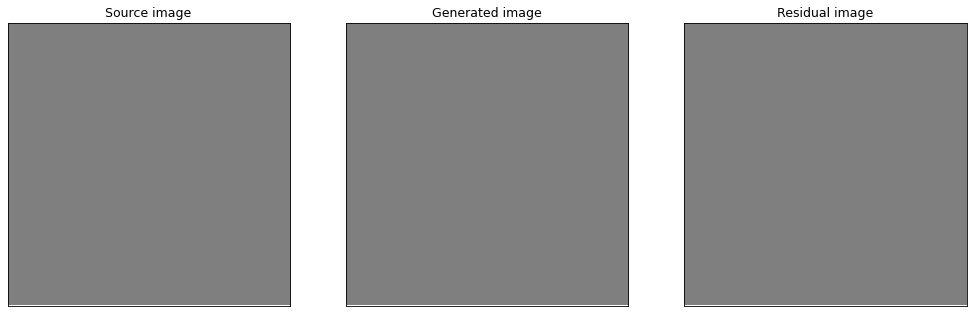

 10%|█         | 10/100 [00:11<01:39,  1.10s/it]

step=10 [-0.027399152517318726, -0.03469766676425934, -0.0448317751288414] ell_infty=51.03506088256836/255


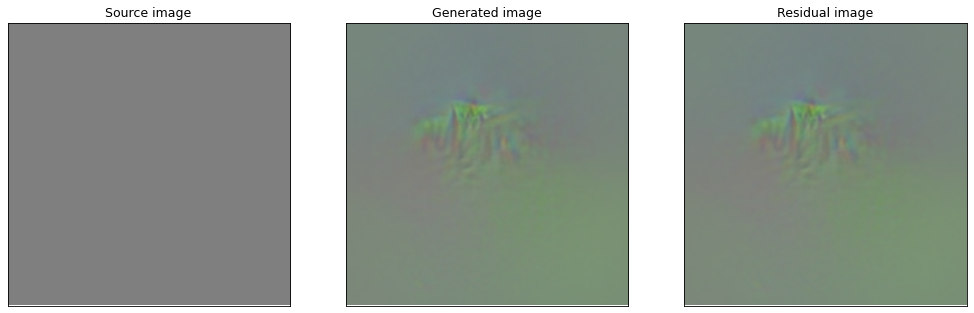

 20%|██        | 20/100 [00:23<01:29,  1.12s/it]

step=20 [-0.06806035339832306, -0.06567253917455673, -0.06581808626651764] ell_infty=58.829856872558594/255


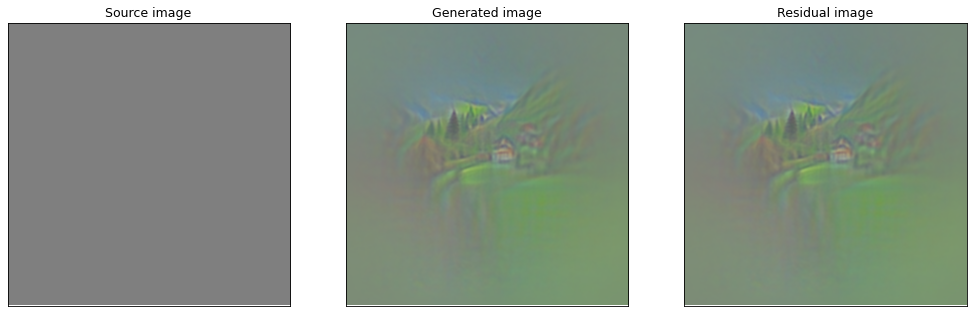

 30%|███       | 30/100 [00:34<01:19,  1.13s/it]

step=30 [-0.07775099575519562, -0.07714475691318512, -0.06971098482608795] ell_infty=70.68477630615234/255


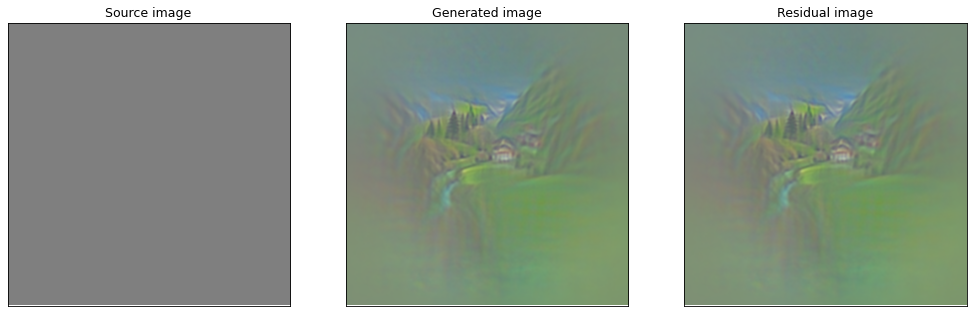

 40%|████      | 40/100 [00:45<01:07,  1.12s/it]

step=40 [-0.08268661797046661, -0.08221367001533508, -0.07188265025615692] ell_infty=75.88998413085938/255


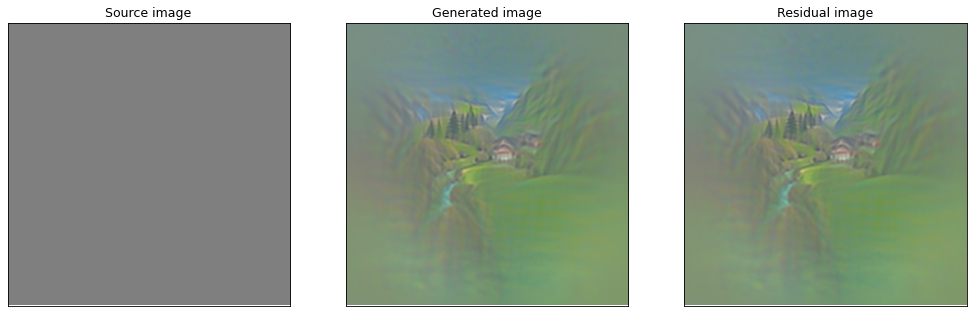

 50%|█████     | 50/100 [00:57<00:56,  1.14s/it]

step=50 [-0.08684509247541428, -0.08607331663370132, -0.07249656319618225] ell_infty=82.31940460205078/255


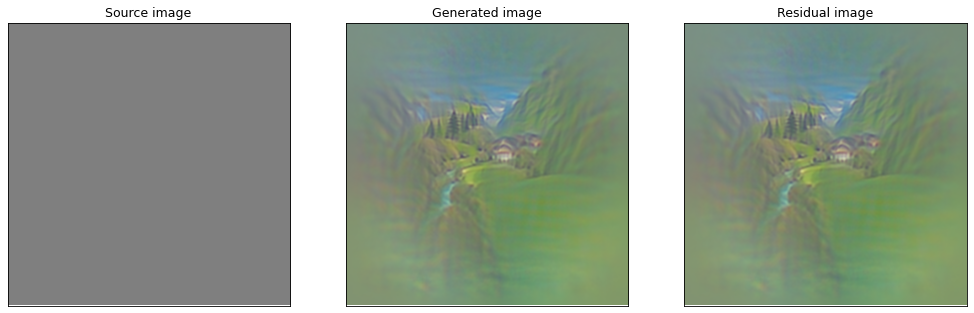

 60%|██████    | 60/100 [01:09<00:48,  1.22s/it]

step=60 [-0.0901106521487236, -0.08811555802822113, -0.07414142787456512] ell_infty=87.23954772949219/255


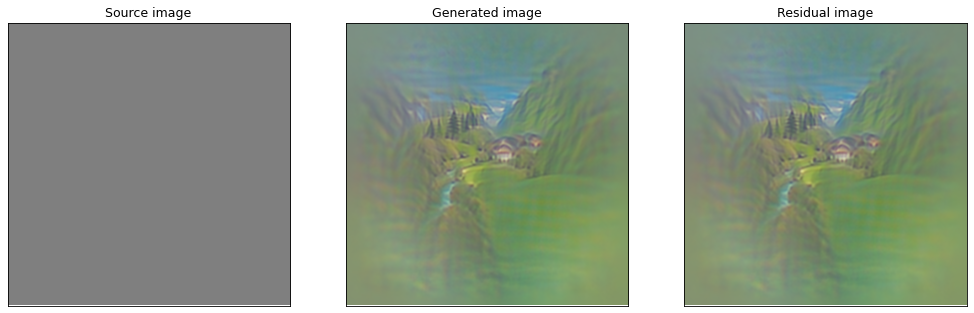

 70%|███████   | 70/100 [01:20<00:34,  1.15s/it]

step=70 [-0.0913926512002945, -0.08914083242416382, -0.07593721151351929] ell_infty=92.11231994628906/255


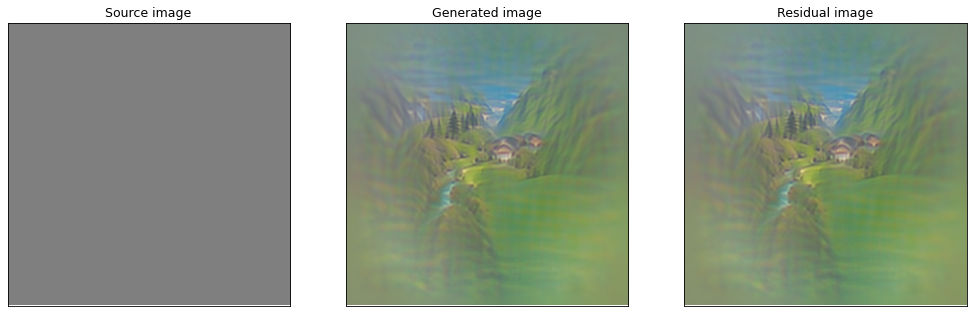

 80%|████████  | 80/100 [01:32<00:22,  1.15s/it]

step=80 [-0.09343618154525757, -0.09087692946195602, -0.07752291858196259] ell_infty=94.7757797241211/255


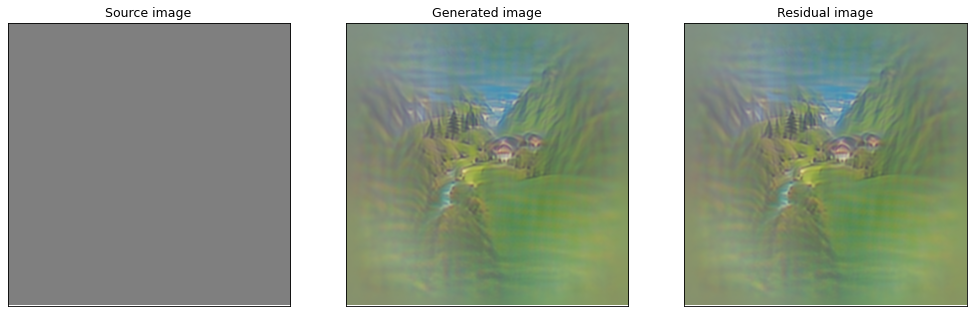

 90%|█████████ | 90/100 [01:43<00:11,  1.14s/it]

step=90 [-0.09476790577173233, -0.091529980301857, -0.07840465009212494] ell_infty=97.40184783935547/255


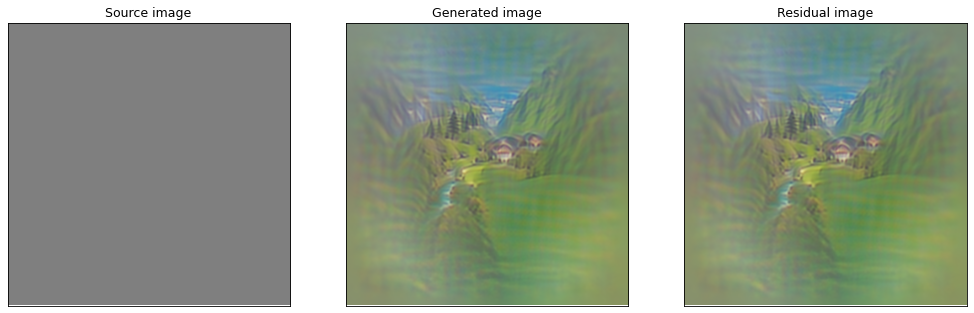

100%|██████████| 100/100 [01:55<00:00,  1.15s/it]


In [13]:
collected_images, components = generate_image(
    models,
    text_weight_pairs,
)

## Resulting image

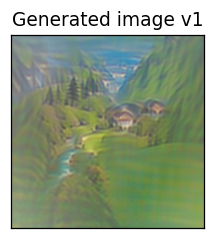

In [14]:
display_images(
    collected_images,
)

### Individual resolutions

In [47]:
components[0].shape

torch.Size([4, 3, 1, 1])

In [51]:
torch.max(components[200])

tensor(0.0029, device='cuda:0', grad_fn=<MaxBackward1>)

tensor([[[-0.0605]],

        [[-0.0353]],

        [[-0.0099]]], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([[[-0.0125, -0.0358],
         [-0.0175,  0.0053]],

        [[-0.0083, -0.0136],
         [-0.0319,  0.0185]],

        [[ 0.0182,  0.0187],
         [-0.0516,  0.0048]]], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([[[-0.0029,  0.0084, -0.0099, -0.0074],
         [-0.0163,  0.0067, -0.0194, -0.0067],
         [-0.0042, -0.0156, -0.0042, -0.0067],
         [-0.0020, -0.0004,  0.0153,  0.0049]],

        [[-0.0020,  0.0024, -0.0034, -0.0109],
         [ 0.0005, -0.0126, -0.0066,  0.0075],
         [-0.0013, -0.0116,  0.0148,  0.0016],
         [-0.0083, -0.0183,  0.0107,  0.0020]],

        [[-0.0181,  0.0287,  0.0060, -0.0179],
         [ 0.0139,  0.0069,  0.0103,  0.0178],
         [-0.0239, -0.0204,  0.0413, -0.0100],
         [-0.0222, -0.0127,  0.0134, -0.0232]]], device='cuda:0',
       grad_fn=<SelectBackward0>)
tensor([[[ 1.8407e-03, -1.4585e-03,  4.5660e-

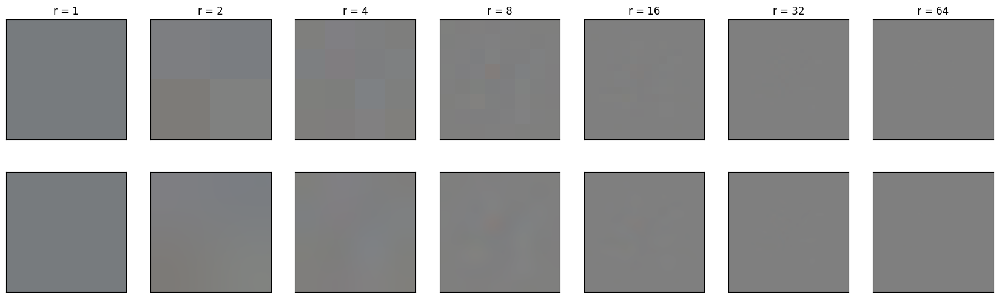

In [49]:
visualize_individual_resolutions(components)

# Task 2 = Generation stability over multiple runs

In [25]:
text_weight_pairs = [
  (1.0, "a beautiful photo of  Mount Pinatubo eruption., detailed"),
  (-0.3,"obscured crater"),
  (0.3, "highly realistic"),
  (-0.3, "multiple exposure"),
]

Resolutions = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [0.022066960111260414, -0.08096211403608322, -0.11707480251789093] ell_infty=0.0/255


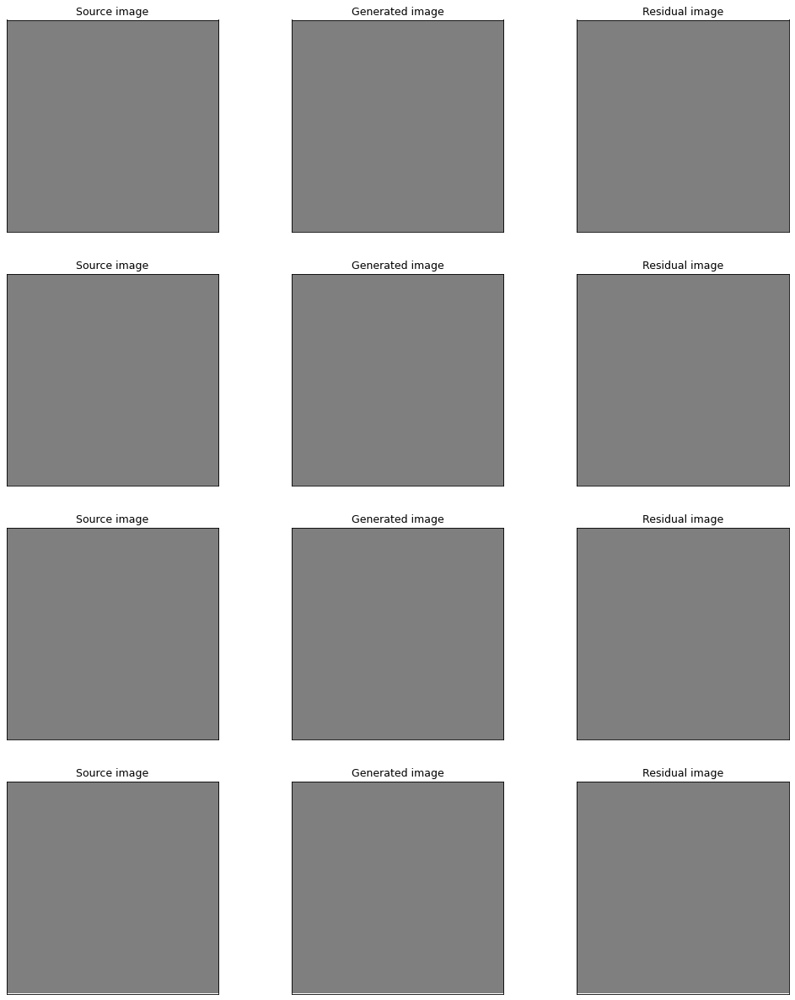

 10%|█         | 10/100 [00:38<05:46,  3.85s/it]

step=10 [-0.09858870506286621, -0.1761898696422577, -0.16530561447143555] ell_infty=60.44700622558594/255


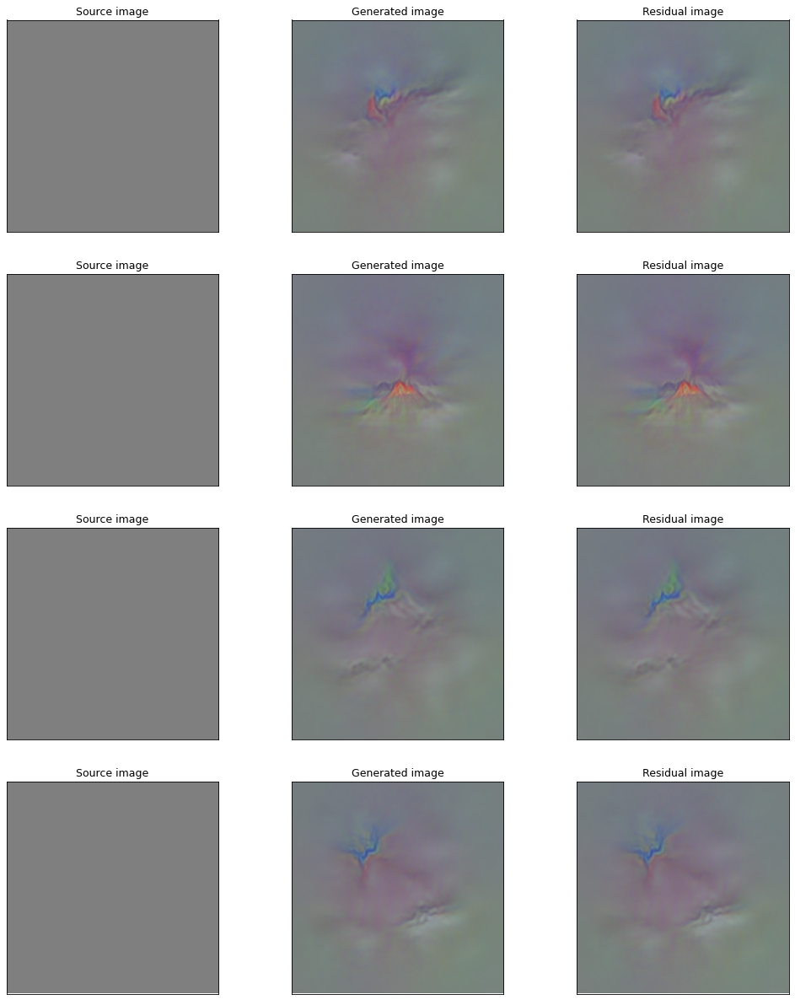

 20%|██        | 20/100 [01:17<05:03,  3.79s/it]

step=20 [-0.20274463295936584, -0.27565696835517883, -0.2537614107131958] ell_infty=68.94412994384766/255


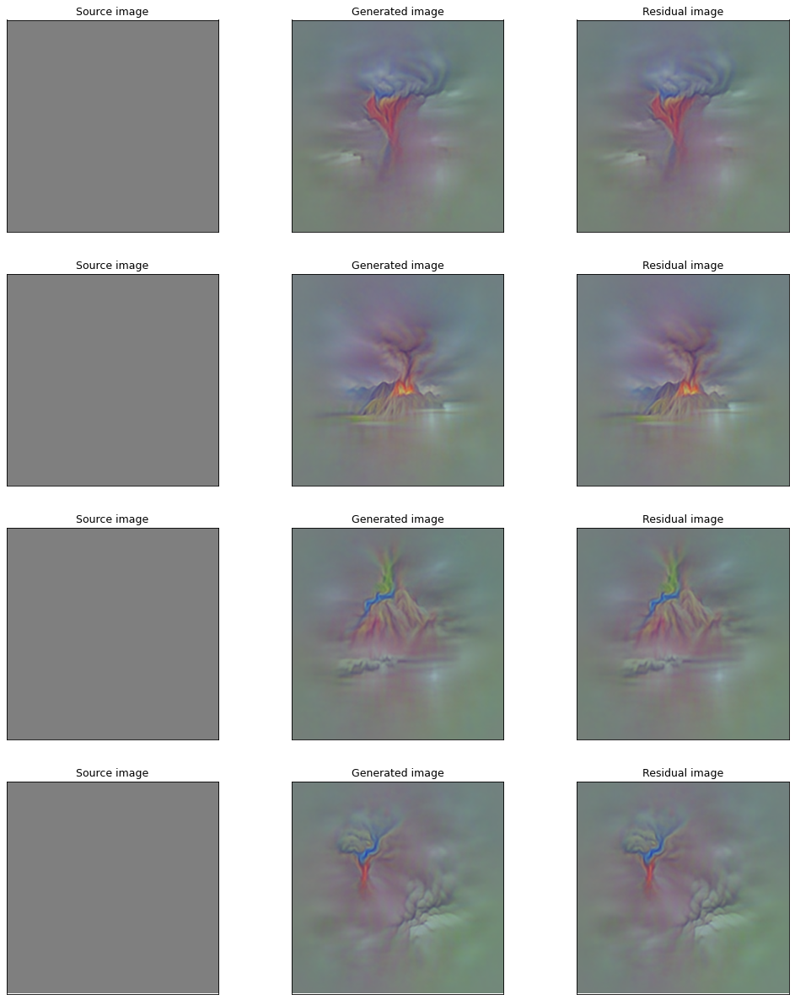

 30%|███       | 30/100 [01:55<04:26,  3.80s/it]

step=30 [-0.257600337266922, -0.3225020170211792, -0.2940523028373718] ell_infty=72.2325439453125/255


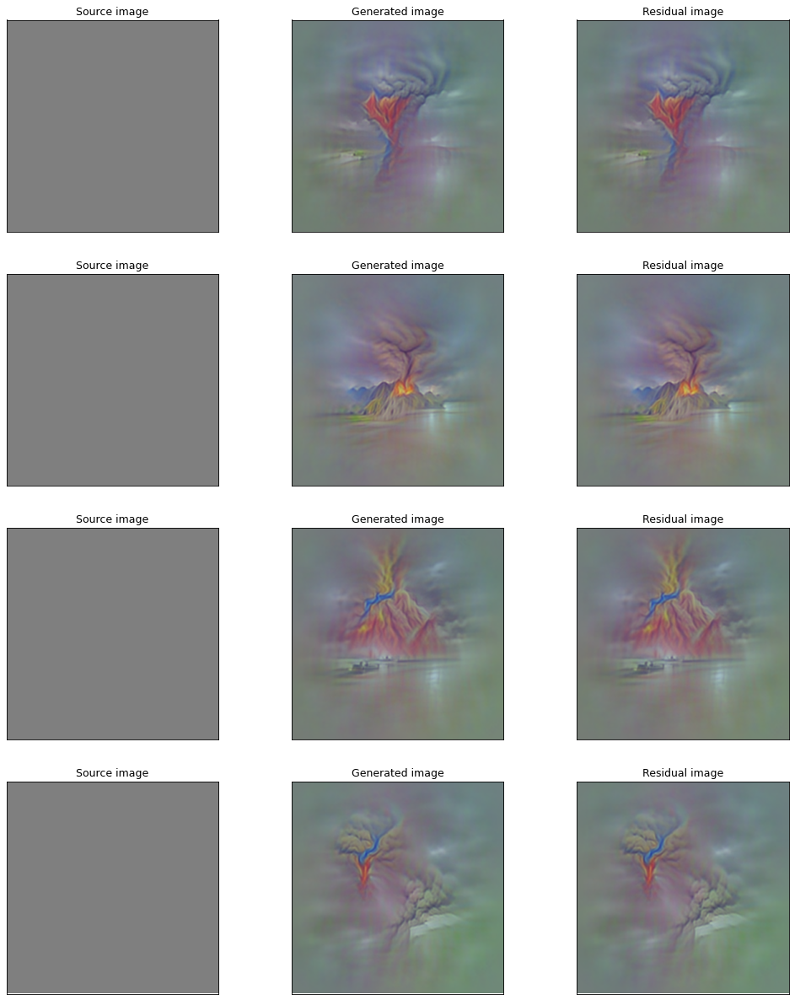

 40%|████      | 40/100 [02:34<03:48,  3.81s/it]

step=40 [-0.287950336933136, -0.35186314582824707, -0.311602920293808] ell_infty=76.82958221435547/255


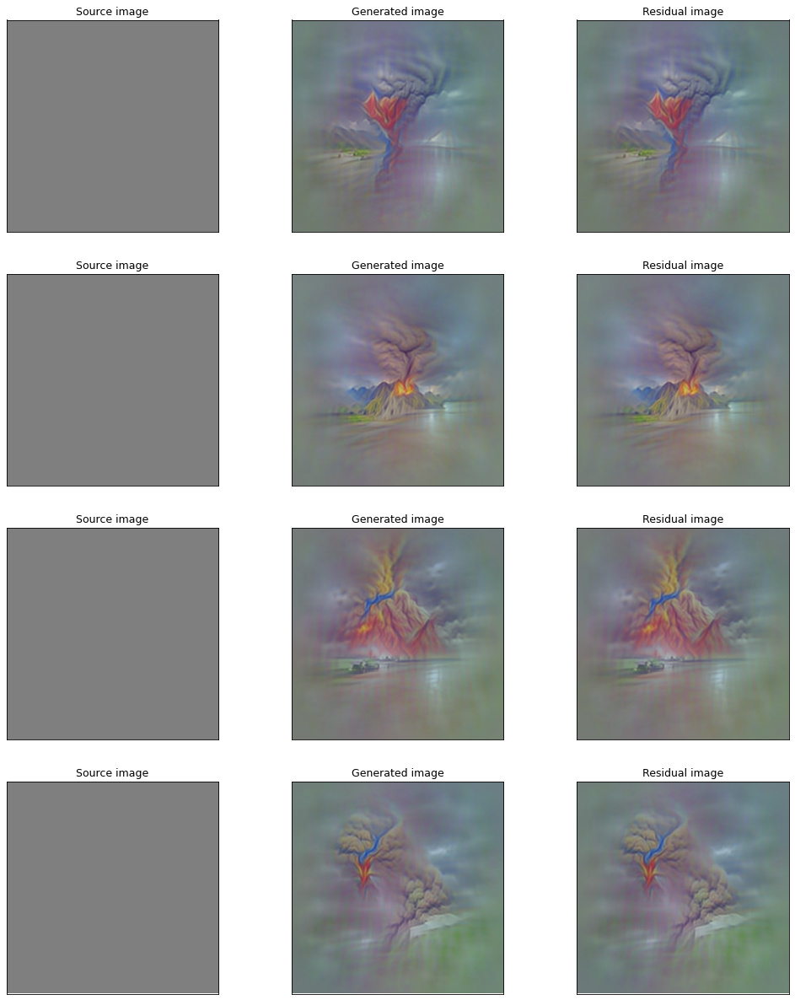

 50%|█████     | 50/100 [03:12<03:10,  3.80s/it]

step=50 [-0.32141271233558655, -0.3713410496711731, -0.3339369595050812] ell_infty=81.66524505615234/255


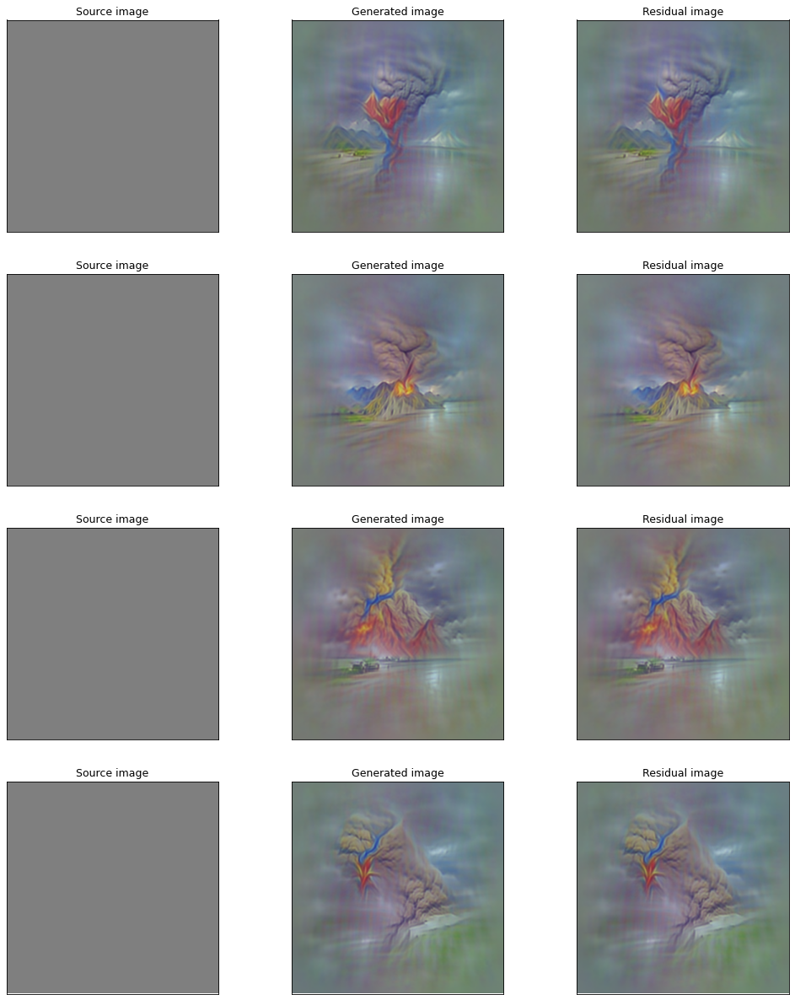

 60%|██████    | 60/100 [03:51<02:32,  3.82s/it]

step=60 [-0.3350362777709961, -0.3830249607563019, -0.3452110290527344] ell_infty=87.75186920166016/255


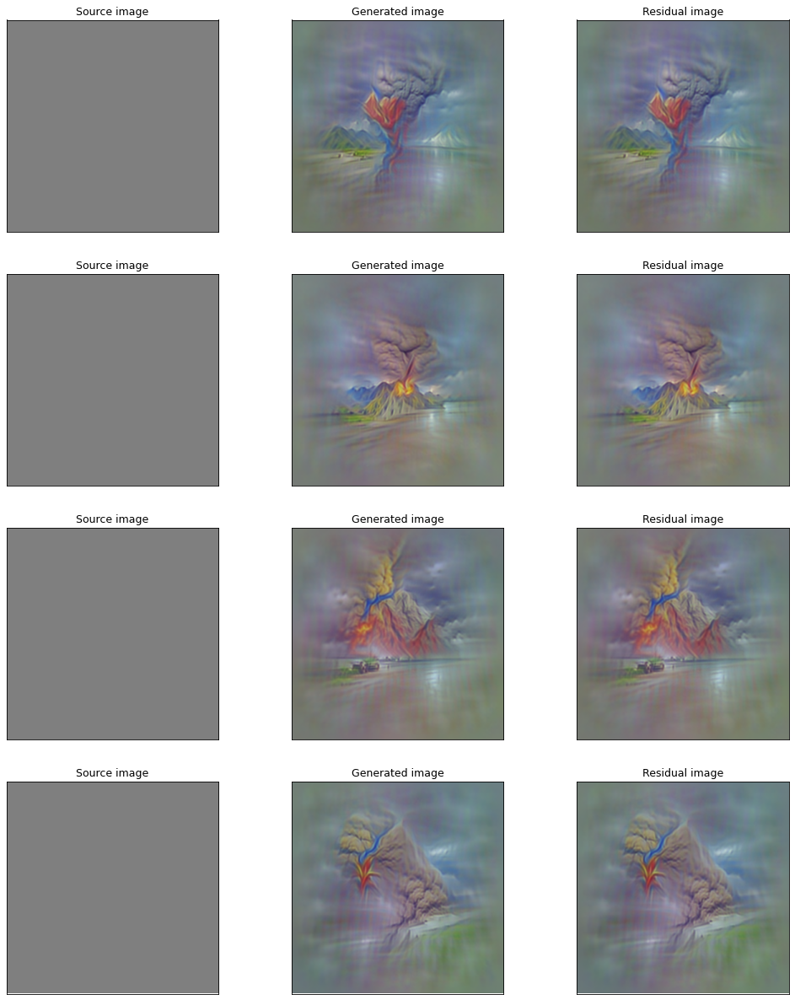

 70%|███████   | 70/100 [04:30<01:54,  3.81s/it]

step=70 [-0.3440025746822357, -0.3997690677642822, -0.3540368974208832] ell_infty=91.8138198852539/255


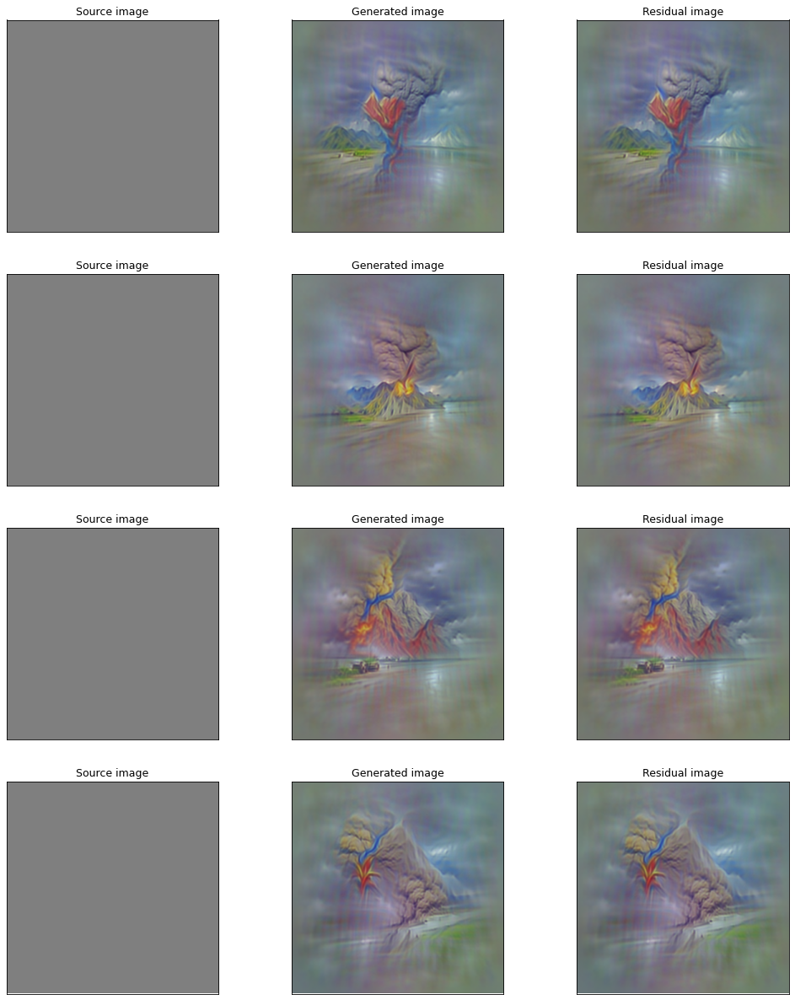

 80%|████████  | 80/100 [05:08<01:16,  3.81s/it]

step=80 [-0.35275501012802124, -0.40623992681503296, -0.36688488721847534] ell_infty=94.15826416015625/255


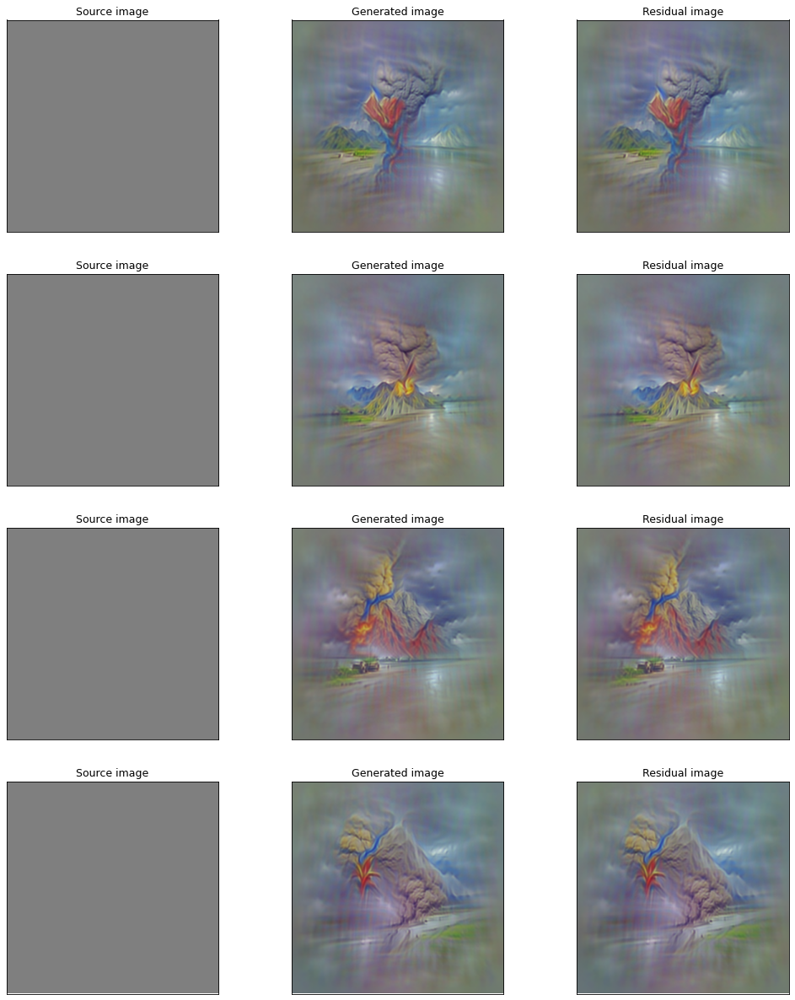

 90%|█████████ | 90/100 [05:47<00:38,  3.80s/it]

step=90 [-0.35865718126296997, -0.4131685495376587, -0.37391144037246704] ell_infty=94.86504364013672/255


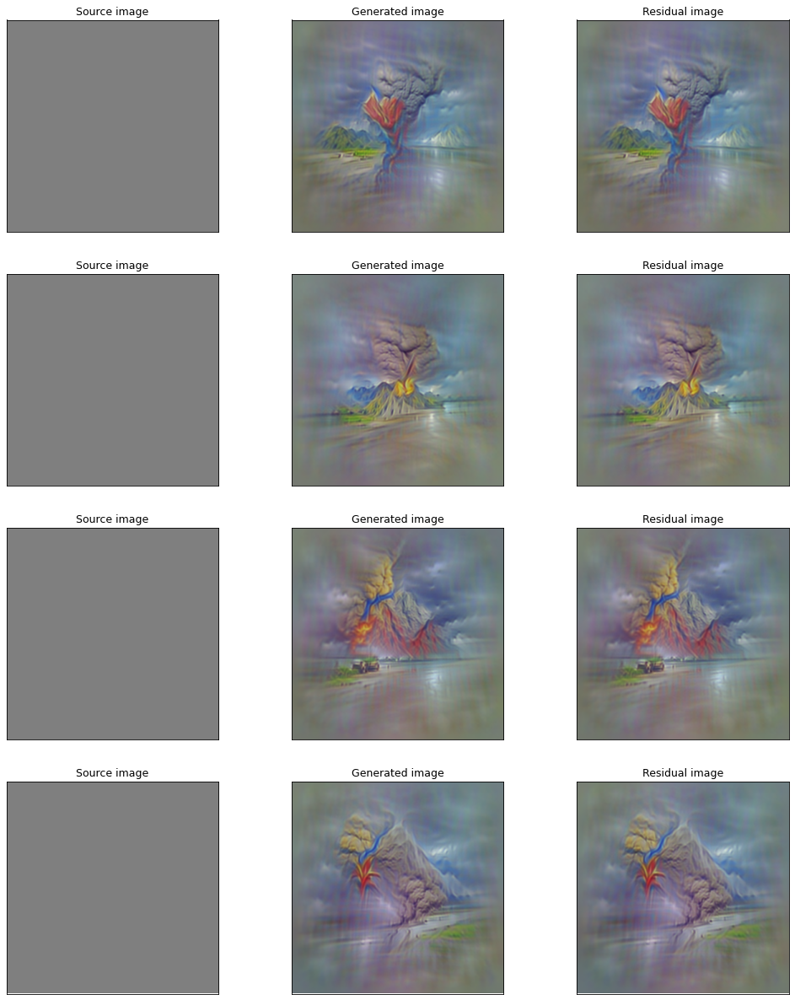

100%|██████████| 100/100 [06:25<00:00,  3.86s/it]


In [26]:
collected_images, components = generate_image(
  models,
  text_weight_pairs,
  num_generations=4,
)

## Resulting images

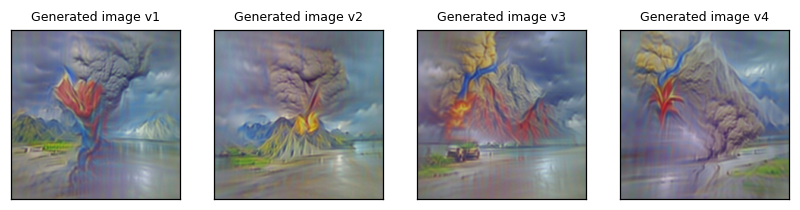

In [31]:
display_images(
    collected_images,
)

# Task 3 = "Style" transfer

In [52]:
class ImageDataset(Dataset):
    def __init__(self, image_paths):
        self.image_paths = image_paths

        self.transform = transforms.Compose([
            transforms.Resize(224),  # Resize shorter side to 224, maintain aspect ratio
            transforms.CenterCrop(224),  # Crop the center 224x224
            transforms.ToTensor(),  # Convert to tensor and normalize to [0,1]
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        tensor = self.transform(image)
        return tensor

def load_images(image_paths, batch_size=32):
    """
    Load images from list of paths and return batched tensor

    Args:
        image_paths (list): List of paths to image files
        batch_size (int): Size of batches to return

    Returns:
        DataLoader that yields tensors of shape [batch_size, 3, 224, 224]
    """
    dataset = ImageDataset(image_paths)
    dataloader = DataLoader(dataset,
                          batch_size=batch_size,
                          shuffle=False,
                          num_workers=4)
    return dataloader

### Starting image

In [53]:
!wget https://www.noesnest.com/wp-content/uploads/sites/14/2020/03/san-francisco-at-night.jpg -O start_image.jpg

image_paths = [
    "start_image.jpg"
]

loader = load_images(image_paths)

batch = next(iter(loader))
starting_image = batch

large_res = 336

eps = 0.1 # to offset the image from the ends of the brigthness range
starting_image = starting_image * (1-2*eps) + eps

# adding padding to make it 336 size in total (not resizing, padding)
starting_image = F.pad(starting_image, ((large_res-starting_image.shape[2])//2, (large_res-starting_image.shape[2])//2, (large_res-starting_image.shape[3])//2, (large_res-starting_image.shape[3])//2), "constant", 0.5)#1-eps)

--2025-03-31 17:56:13--  https://www.noesnest.com/wp-content/uploads/sites/14/2020/03/san-francisco-at-night.jpg
Resolving www.noesnest.com (www.noesnest.com)... 8.29.155.199
Connecting to www.noesnest.com (www.noesnest.com)|8.29.155.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 744386 (727K) [image/jpeg]
Saving to: ‘start_image.jpg’

start_image.jpg     100%[===================>] 726.94K  2.07MB/s    in 0.3s    

2025-03-31 17:56:13 (2.07 MB/s) - ‘start_image.jpg’ saved [744386/744386]



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


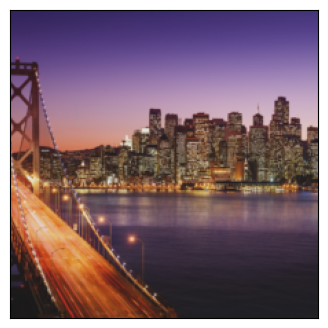

In [54]:
offset = (large_res - 224) // 2
plt.figure(figsize=(4 * starting_image.shape[0], 4))
for i in range(starting_image.shape[0]):
    plt.subplot(1, starting_image.shape[0], i + 1)
    img_show(starting_image[i][:, offset:-offset, offset:-offset])

plt.show()

### "Style" guiding image

In [55]:
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg -O guiding_image1.png

image_paths = [
    "guiding_image1.png"
]

loader = load_images(image_paths)
batch = next(iter(loader))
guiding_image = batch

--2025-03-31 17:56:19--  https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 356804 (348K) [image/jpeg]
Saving to: ‘guiding_image1.png’

guiding_image1.png  100%[===================>] 348.44K  --.-KB/s    in 0.08s   

2025-03-31 17:56:19 (4.38 MB/s) - ‘guiding_image1.png’ saved [356804/356804]



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


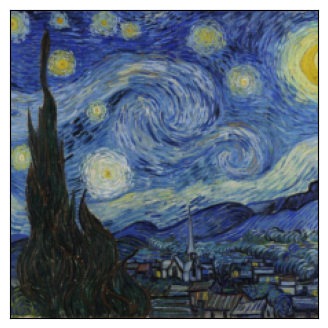

In [56]:
plt.figure(figsize=(4 * guiding_image.shape[0], 4))
for i in range(guiding_image.shape[0]):
    plt.subplot(1, guiding_image.shape[0], i + 1)
    img_show(guiding_image[i])

plt.show()

### Combining the two

Resolutions = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [0, 0, -1] ell_infty=0/255


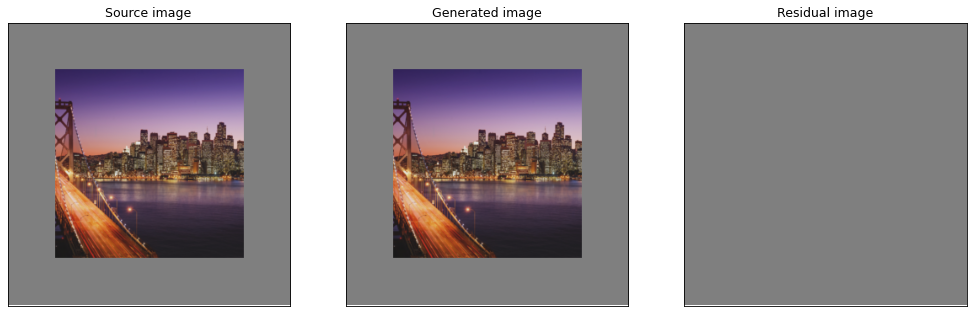

 10%|█         | 10/100 [00:11<01:41,  1.13s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04348147..1.0065387].


step=10 [-1, -1, -1] ell_infty=139/255


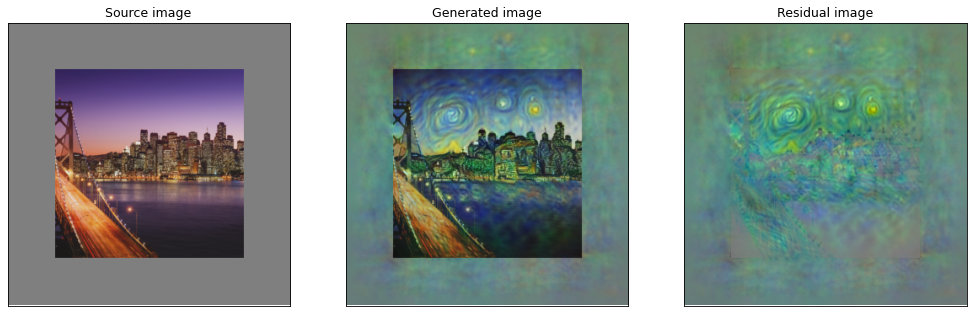

 20%|██        | 20/100 [00:23<01:31,  1.14s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12942499..0.99643445].


step=20 [-1, -1, -1] ell_infty=161/255


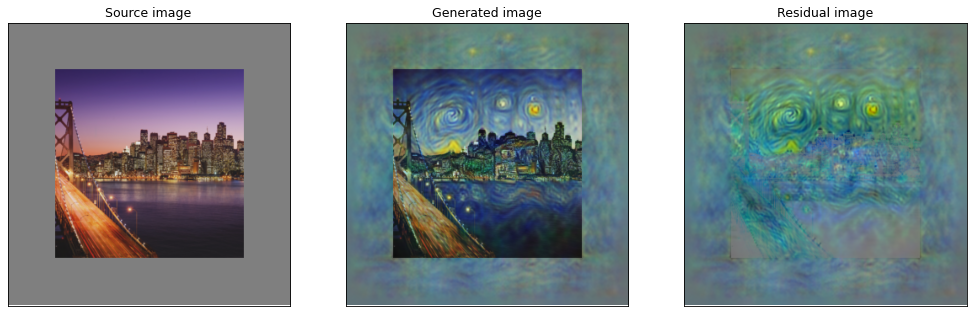

 30%|███       | 30/100 [00:34<01:21,  1.16s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14910293..0.9958168].


step=30 [-1, -1, -1] ell_infty=166/255


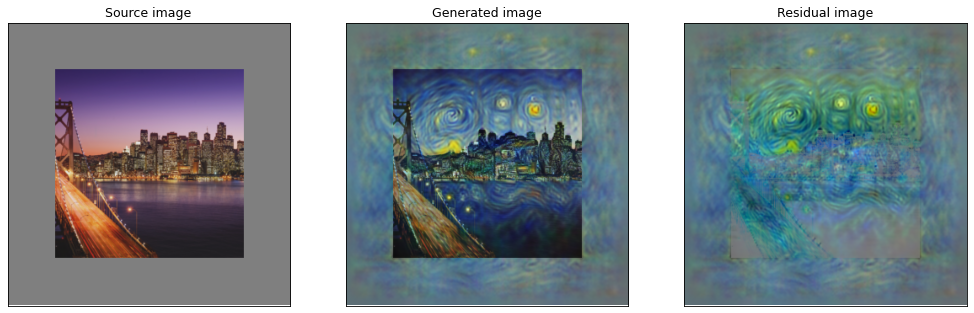

 40%|████      | 40/100 [00:46<01:08,  1.15s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15796423..0.9975774].


step=40 [-1, -1, -1] ell_infty=168/255


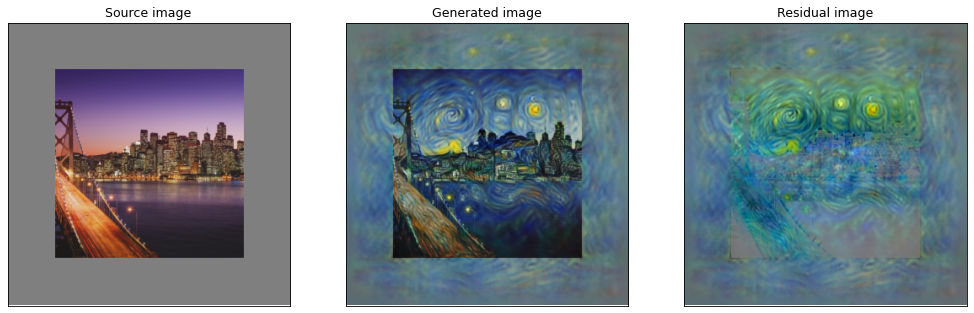

 50%|█████     | 50/100 [00:58<00:57,  1.14s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16455603..1.000316].


step=50 [-1, -1, -1] ell_infty=169/255


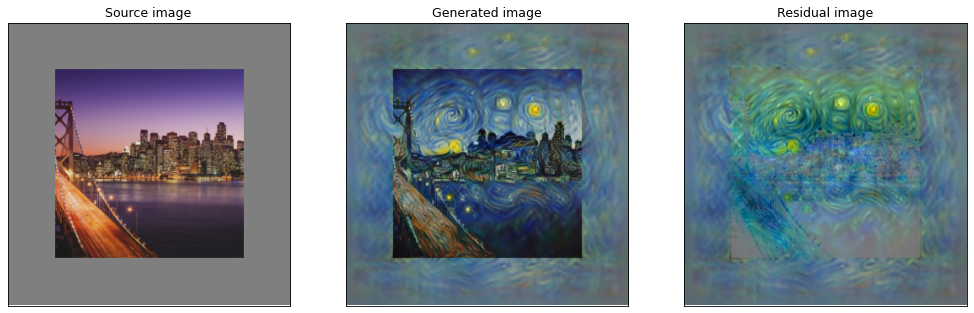

 60%|██████    | 60/100 [01:09<00:45,  1.14s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1687336..1.0012282].


step=60 [-1, -1, -1] ell_infty=171/255


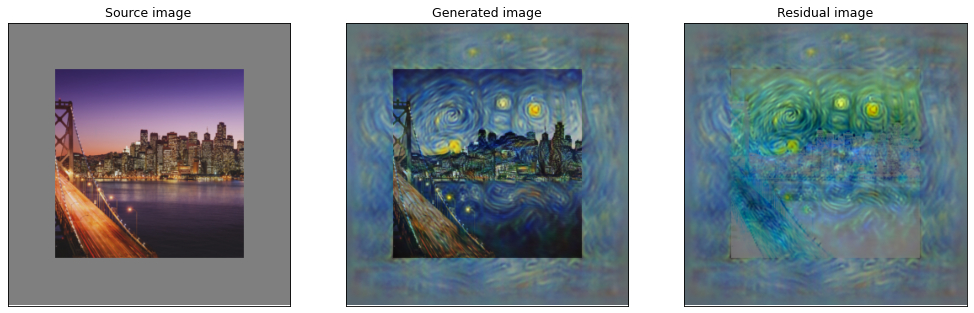

 70%|███████   | 70/100 [01:21<00:33,  1.13s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17175001..1.0035422].


step=70 [-1, -1, -1] ell_infty=171/255


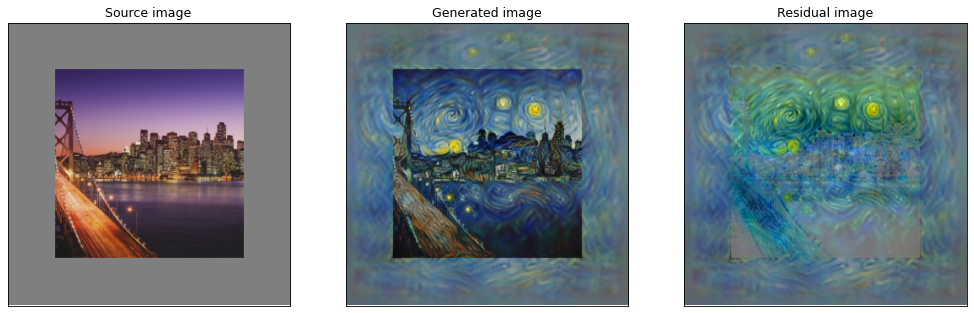

 80%|████████  | 80/100 [01:32<00:22,  1.13s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17366838..1.0018134].


step=80 [-1, -1, -1] ell_infty=172/255


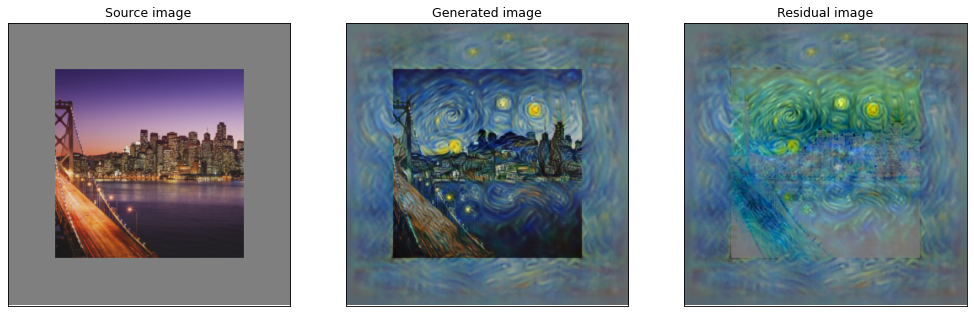

 90%|█████████ | 90/100 [01:44<00:11,  1.14s/it]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17512167..1.0046705].


step=90 [-1, -1, -1] ell_infty=172/255


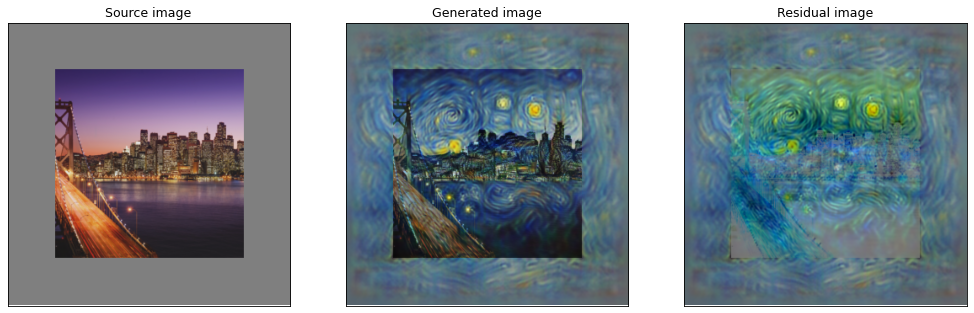

100%|██████████| 100/100 [01:55<00:00,  1.16s/it]


In [62]:
collected_images, components = generate_image(
  models,
  text_weight_pairs = [],
  guiding_images = guiding_image,
  source_image = starting_image.detach().cpu(),
)

## Resulting image

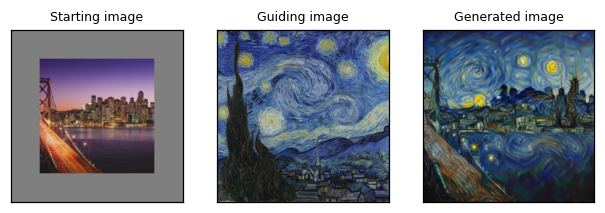

In [79]:
display_images(
    collected_images,
    guiding_image = guiding_image,
    starting_image = starting_image
)

# Task 4 = Reconstructing an image from its embedding

## Getting the image to reconstruct

In [80]:
!wget https://www.rmg.co.uk/sites/default/files/styles/full_width_1440/public/Henry%20VIII.jpg -O guiding_image1.png

image_paths = [
    "guiding_image1.png"
]

loader = load_images(image_paths)
batch = next(iter(loader))
guiding_image = batch

--2025-03-31 18:07:46--  https://www.rmg.co.uk/sites/default/files/styles/full_width_1440/public/Henry%20VIII.jpg
Resolving www.rmg.co.uk (www.rmg.co.uk)... 23.185.0.2, 2620:12a:8001::2, 2620:12a:8000::2
Connecting to www.rmg.co.uk (www.rmg.co.uk)|23.185.0.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 147318 (144K) [image/jpeg]
Saving to: ‘guiding_image1.png’

guiding_image1.png  100%[===================>] 143.87K  --.-KB/s    in 0.02s   

2025-03-31 18:07:46 (7.36 MB/s) - ‘guiding_image1.png’ saved [147318/147318]



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


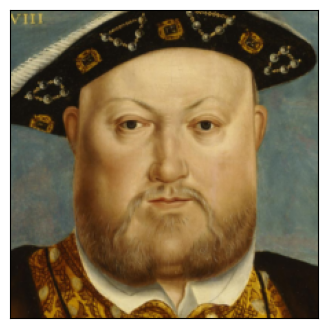

In [81]:
plt.figure(figsize=(4 * guiding_image.shape[0], 4))
for i in range(guiding_image.shape[0]):
    plt.subplot(1, guiding_image.shape[0], i + 1)
    img_show(guiding_image[i])

plt.show()

## Reconstruction the image

Resolutions = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [0, 0, 0] ell_infty=0/255


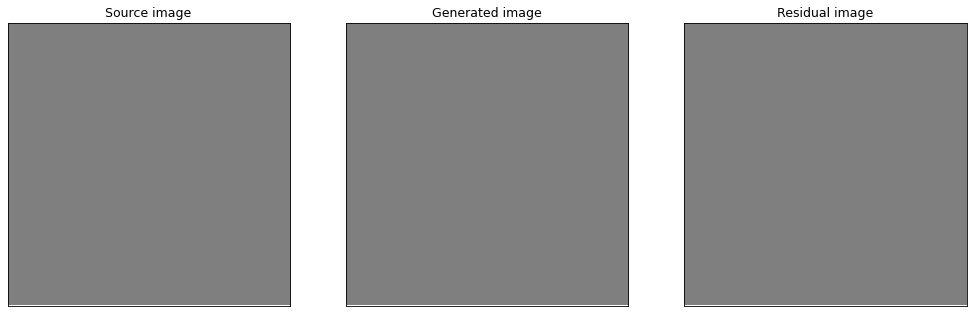

 10%|█         | 10/100 [00:11<01:44,  1.16s/it]

step=10 [0, 0, 0] ell_infty=70/255


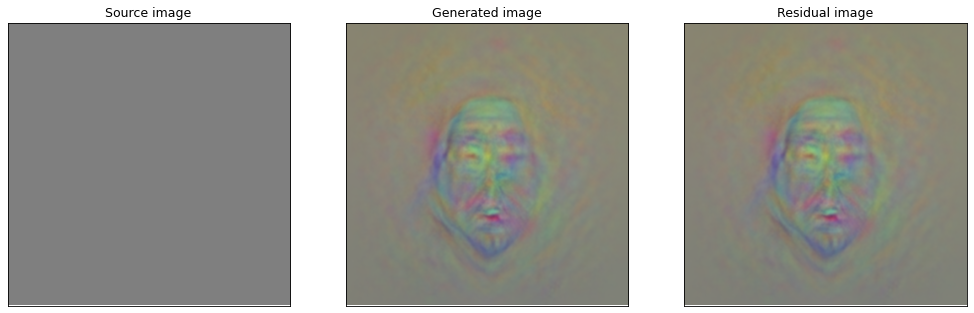

 20%|██        | 20/100 [00:23<01:32,  1.16s/it]

step=20 [0, 0, 0] ell_infty=96/255


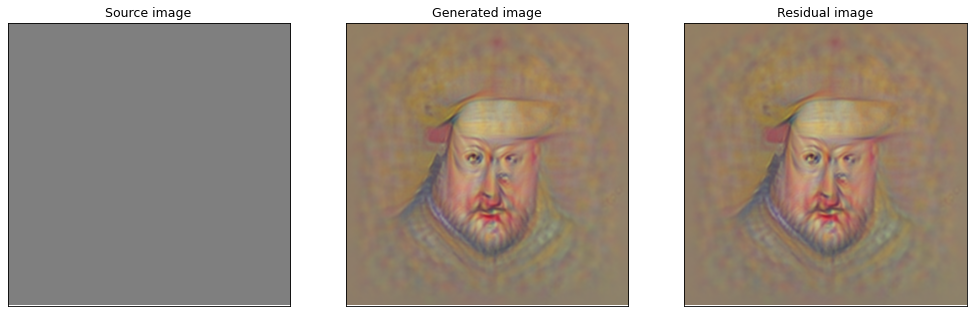

 30%|███       | 30/100 [00:35<01:20,  1.15s/it]

step=30 [0, 0, 0] ell_infty=93/255


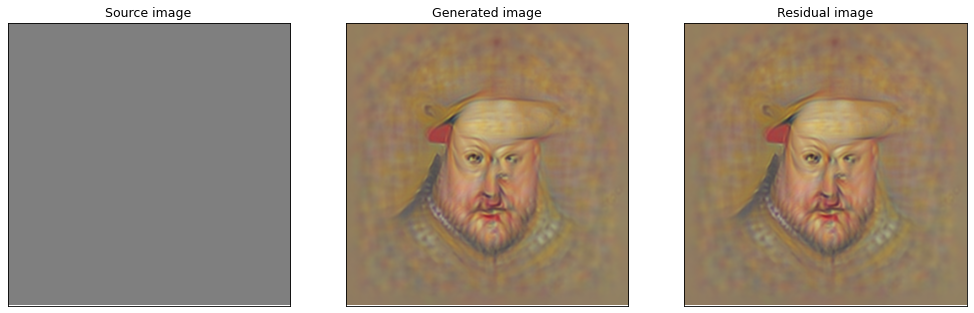

 40%|████      | 40/100 [00:46<01:08,  1.14s/it]

step=40 [0, 0, 0] ell_infty=96/255


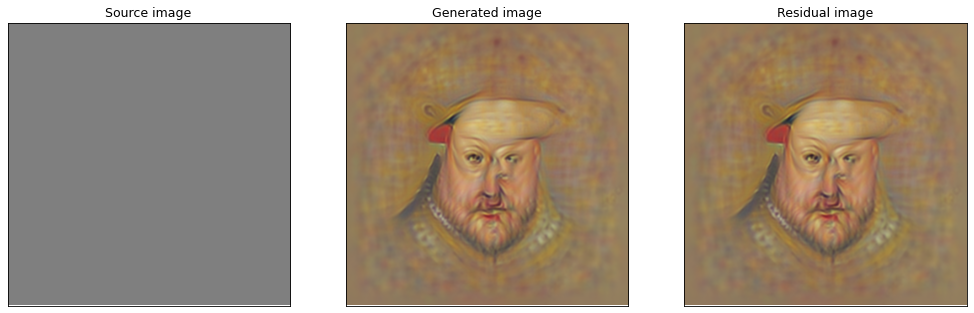

 50%|█████     | 50/100 [00:58<00:56,  1.13s/it]

step=50 [0, 0, 0] ell_infty=101/255


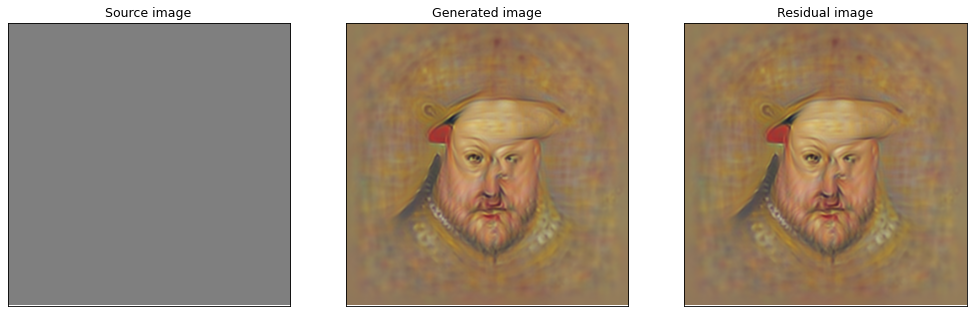

 60%|██████    | 60/100 [01:09<00:45,  1.13s/it]

step=60 [0, 0, 0] ell_infty=106/255


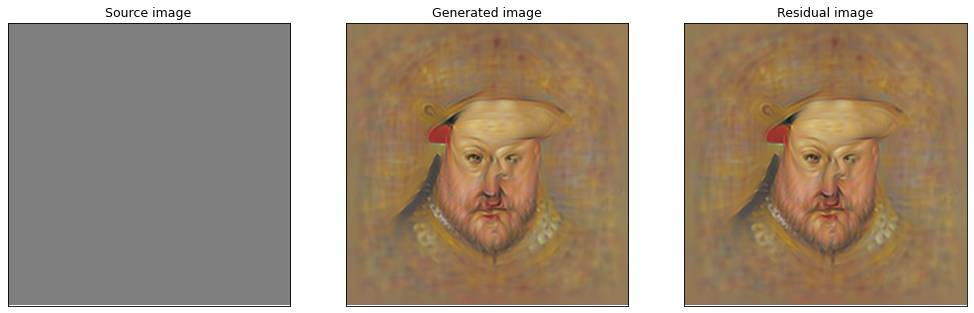

 70%|███████   | 70/100 [01:21<00:34,  1.13s/it]

step=70 [0, 0, 0] ell_infty=109/255


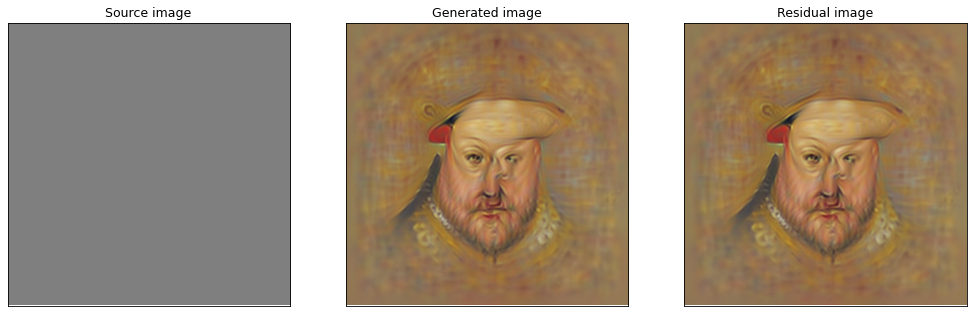

 80%|████████  | 80/100 [01:32<00:22,  1.13s/it]

step=80 [0, 0, 0] ell_infty=112/255


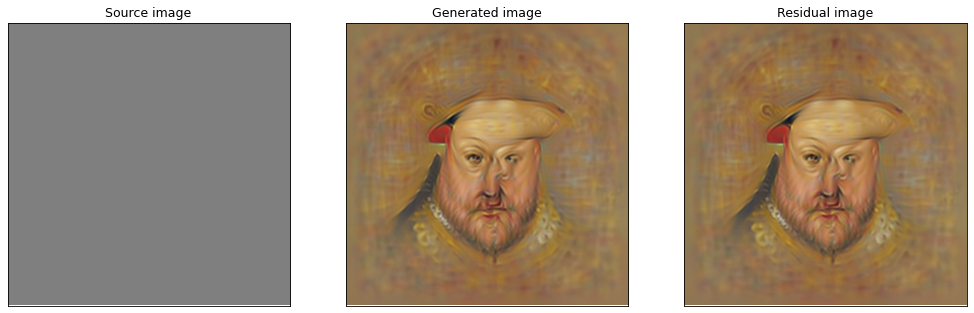

 90%|█████████ | 90/100 [01:44<00:11,  1.14s/it]

step=90 [0, 0, 0] ell_infty=113/255


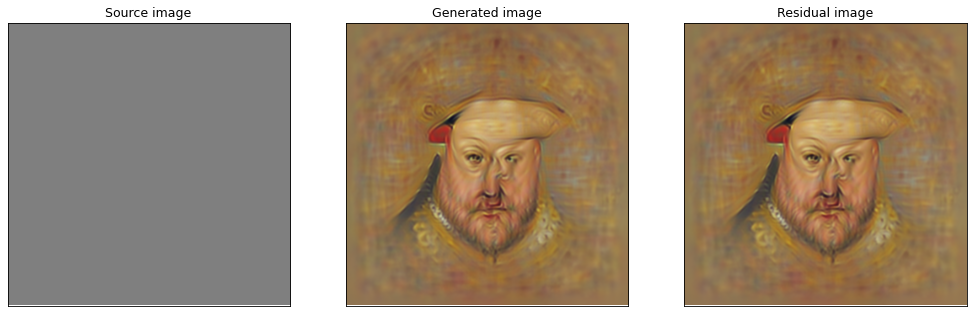

100%|██████████| 100/100 [01:55<00:00,  1.16s/it]


In [82]:
# helping the reconstruction with a content agnostic set of prompts
text_weight_pairs = [
  (0.6,"cohesive single subject"),
  (-0.6, "multiple exposure"),
]

collected_images, _ = generate_image(
  models,
  text_weight_pairs = text_weight_pairs,
  guiding_images = guiding_image,
)

## Resulting image

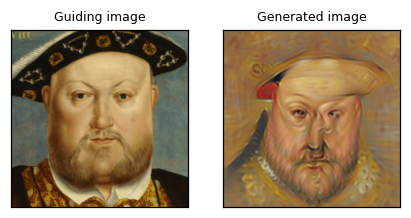

In [85]:
display_images(
    collected_images[0],
    guiding_image = guiding_image,
)